In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from dataprep.eda import plot,plot_correlation,plot_missing

In [78]:
df = pd.read_csv('deliveries.csv')

In [79]:
df.tail()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
179073,11415,2,Chennai Super Kings,Mumbai Indians,20,2,RA Jadeja,SR Watson,SL Malinga,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
179074,11415,2,Chennai Super Kings,Mumbai Indians,20,3,SR Watson,RA Jadeja,SL Malinga,0,...,0,0,0,0,2,0,2,NaN,NaN,NaN
179075,11415,2,Chennai Super Kings,Mumbai Indians,20,4,SR Watson,RA Jadeja,SL Malinga,0,...,0,0,0,0,1,0,1,SR Watson,run out,KH Pandya
179076,11415,2,Chennai Super Kings,Mumbai Indians,20,5,SN Thakur,RA Jadeja,SL Malinga,0,...,0,0,0,0,2,0,2,NaN,NaN,NaN
179077,11415,2,Chennai Super Kings,Mumbai Indians,20,6,SN Thakur,RA Jadeja,SL Malinga,0,...,0,0,0,0,0,0,0,SN Thakur,lbw,NaN


In [80]:
df.shape

(179078, 21)

In [81]:
df.isnull().sum()

match_id                 0
inning                   0
batting_team             0
bowling_team             0
over                     0
ball                     0
batsman                  0
non_striker              0
bowler                   0
is_super_over            0
wide_runs                0
bye_runs                 0
legbye_runs              0
noball_runs              0
penalty_runs             0
batsman_runs             0
extra_runs               0
total_runs               0
player_dismissed    170244
dismissal_kind      170244
fielder             172630
dtype: int64

In [82]:
df.dtypes

match_id             int64
inning               int64
batting_team        object
bowling_team        object
over                 int64
ball                 int64
batsman             object
non_striker         object
bowler              object
is_super_over        int64
wide_runs            int64
bye_runs             int64
legbye_runs          int64
noball_runs          int64
penalty_runs         int64
batsman_runs         int64
extra_runs           int64
total_runs           int64
player_dismissed    object
dismissal_kind      object
fielder             object
dtype: object

In [83]:
# univariate analysis

[ProgressBar] ProgressBar takes additional 10%+ of the computation time, consider disable it by passing 'progress=False' to the plot function.



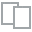
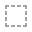
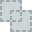
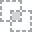
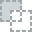
...
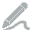
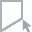
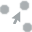
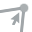
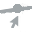

In [84]:
plot(df)

In [85]:
df = df.dropna(axis=1)

In [86]:
df.drop(['is_super_over','wide_runs','bye_runs','legbye_runs','noball_runs','penalty_runs','extra_runs'],axis=1,inplace=True)

In [87]:
df.isnull().sum()

match_id        0
inning          0
batting_team    0
bowling_team    0
over            0
ball            0
batsman         0
non_striker     0
bowler          0
batsman_runs    0
total_runs      0
dtype: int64

In [88]:
df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,batsman_runs,total_runs
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,0
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,4,4
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,0
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,2


In [89]:
df.describe()

,match_id,inning,over,ball,batsman_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,1.246864,1.313897
std,3472.322805,0.502074,5.677684,1.806966,1.608270,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,1.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,1.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,7.000000,10.000000


In [90]:
duplicates = df.duplicated()

In [91]:
## the no.of duplicate rows 
print('no.of duplicate rows:%d'%duplicates.sum())

no.of duplicate rows:24


In [92]:
df.drop_duplicates()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,batsman_runs,total_runs
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,0
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,4,4
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,0
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,2
...,...,...,...,...,...,...,...,...,...,...,...
179073,11415,2,Chennai Super Kings,Mumbai Indians,20,2,RA Jadeja,SR Watson,SL Malinga,1,1
179074,11415,2,Chennai Super Kings,Mumbai Indians,20,3,SR Watson,RA Jadeja,SL Malinga,2,2
179075,11415,2,Chennai Super Kings,Mumbai Indians,20,4,SR Watson,RA Jadeja,SL Malinga,1,1
179076,11415,2,Chennai Super Kings,Mumbai Indians,20,5,SN Thakur,RA Jadeja,SL Malinga,2,2


In [93]:
df['total_runs'].value_counts()

1     73059
0     63002
4     20599
2     13125
6      8148
3       688
5       339
8        64
7        38
10       16
Name: total_runs, dtype: int64

In [94]:
# Bivariate analysis

In [95]:
df.groupby('batting_team')['total_runs'].value_counts()

batting_team         total_runs
Chennai Super Kings  1             8103
                     0             6798
                     4             2215
                     2             1543
                     6              972
                                   ... 
Sunrisers Hyderabad  3               59
                     5               21
                     8                8
                     7                4
                     10               2
Name: total_runs, Length: 131, dtype: int64


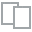
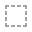
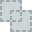
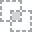
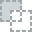
...
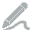
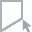
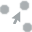
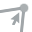
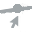

In [96]:
plot(df)


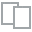
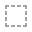
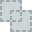
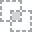
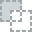
...
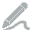
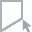
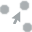
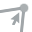
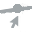

In [97]:
plot(df, "total_runs", bins=20)

In [98]:
cor=df.corr()
cor['total_runs'].sort_values(ascending=False)

total_runs      1.000000
batsman_runs    0.977278
over            0.086326
match_id        0.030727
ball            0.007414
inning         -0.005485
Name: total_runs, dtype: float64

In [99]:
df.corr()

,match_id,inning,over,ball,batsman_runs,total_runs
match_id,1.000000,0.003958,0.008268,-0.001349,0.033510,0.030727
inning,0.003958,1.000000,-0.050076,-0.003943,-0.005362,-0.005485
over,0.008268,-0.050076,1.000000,-0.007424,0.086701,0.086326
ball,-0.001349,-0.003943,-0.007424,1.000000,0.007950,0.007414
batsman_runs,0.033510,-0.005362,0.086701,0.007950,1.000000,0.977278
total_runs,0.030727,-0.005485,0.086326,0.007414,0.977278,1.000000


In [100]:
df.describe()

,match_id,inning,over,ball,batsman_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,1.246864,1.313897
std,3472.322805,0.502074,5.677684,1.806966,1.608270,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,1.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,1.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,7.000000,10.000000


In [101]:
# handling outliers

In [102]:
# from above stats 

In [103]:
iqr = 1

In [104]:
q1 = 0

In [105]:
q3 = 1

In [106]:
lower_limit = q1-(1.5*iqr)

In [107]:
lower_limit

-1.5

In [108]:
upper_limit = q3+(1.5*iqr)

In [109]:
upper_limit

2.5

In [110]:
out_id = df[(df['total_runs']<lower_limit)|(df['total_runs']>upper_limit)].index

In [111]:
out_id.nunique()

29892

In [112]:
# df.drop(out_id,axis=0)  to remove outlier indexes

In [113]:
# here we are getting all upper limit outlier index
out_idx = df[df['total_runs']>upper_limit]['total_runs'].values

In [114]:
out_idx

array([4, 4, 6, ..., 6, 6, 8], dtype=int64)

In [115]:
# here we are creating a dictionary using fromkeys function to replace the indexes
replacing_dict = {}.fromkeys(out_idx,upper_limit)

In [116]:
replacing_dict

{4: 2.5, 6: 2.5, 3: 2.5, 5: 2.5, 7: 2.5, 10: 2.5, 8: 2.5}

In [117]:
df.replace(replacing_dict,inplace=True)

C:\Users\vamshi\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='total_runs'>

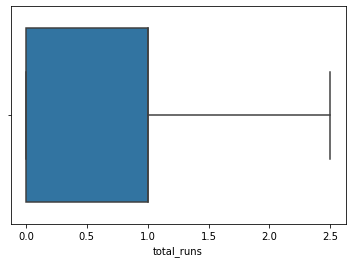

In [118]:
sns.boxplot(df['total_runs'])


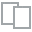
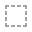
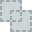
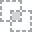
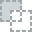
...
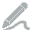
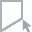
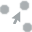
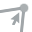
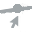

In [119]:
plot(df,'batsman_runs')


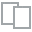
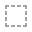
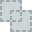
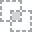
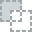
...
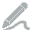
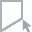
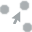
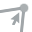
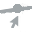

In [120]:
plot(df,'over')


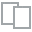
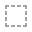
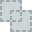
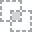
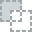
...
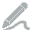
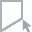
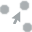
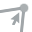
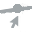

In [121]:
plot(df,'ball')

In [122]:
out_id = df[(df['ball']<lower_limit)|(df['ball']>upper_limit)].index

In [123]:
#  ball containg 122 outliers
out_id.nunique()

122

In [124]:
q1 = df['ball'].describe()['25%']

In [125]:
q3 = df['ball'].describe()['75%']

In [126]:
iqr = q3-q1

In [127]:
iqr

0.5

In [128]:
lower_l = q1-(1.5*iqr)

In [129]:
upper_l = q3+(1.5*iqr)

In [130]:
out_id = df[df['ball']>upper_l]['ball'].values

In [131]:
df['ball'].unique()

array([1. , 2. , 2.5, 9. ])

In [132]:
replace_dict = {}.fromkeys(out_id,upper_limit)

In [133]:
replace_dict

{9.0: 2.5}

In [134]:
df.replace(replace_dict,inplace=True)

C:\Users\vamshi\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ball'>

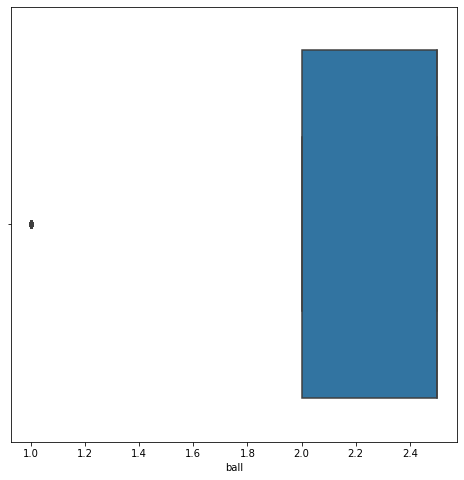

In [135]:
plt.figure(figsize=(8,8))
sns.boxplot(df['ball'])


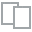
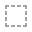
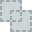
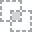
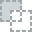
...
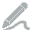
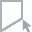
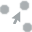
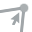
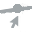

In [136]:
plot(df)

In [139]:
df.dtypes

match_id        float64
inning          float64
batting_team     object
bowling_team     object
over            float64
ball            float64
batsman          object
non_striker      object
bowler           object
batsman_runs    float64
total_runs      float64
dtype: object

In [140]:
cat

,batting_team,bowling_team,batsman,non_striker,bowler
0,Sunrisers Hyderabad,Royal Challengers Bangalore,DA Warner,S Dhawan,TS Mills
1,Sunrisers Hyderabad,Royal Challengers Bangalore,DA Warner,S Dhawan,TS Mills
2,Sunrisers Hyderabad,Royal Challengers Bangalore,DA Warner,S Dhawan,TS Mills
3,Sunrisers Hyderabad,Royal Challengers Bangalore,DA Warner,S Dhawan,TS Mills
4,Sunrisers Hyderabad,Royal Challengers Bangalore,DA Warner,S Dhawan,TS Mills
...,...,...,...,...,...
179073,Chennai Super Kings,Mumbai Indians,RA Jadeja,SR Watson,SL Malinga
179074,Chennai Super Kings,Mumbai Indians,SR Watson,RA Jadeja,SL Malinga
179075,Chennai Super Kings,Mumbai Indians,SR Watson,RA Jadeja,SL Malinga
179076,Chennai Super Kings,Mumbai Indians,SN Thakur,RA Jadeja,SL Malinga


In [69]:
df['batsman'].value_counts()

V Kohli           4211
SK Raina          4044
RG Sharma         3816
S Dhawan          3776
G Gambhir         3524
                  ... 
K Ahmed              1
P Raj                1
S Kaushik            1
V Pratap Singh       1
NJ Rimmington        1
Name: batsman, Length: 516, dtype: int64

In [70]:
df['bowler'].nunique()

405

In [71]:
df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,batsman_runs,total_runs
0,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,1.0,DA Warner,S Dhawan,TS Mills,0.0,0.0
1,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.0,DA Warner,S Dhawan,TS Mills,0.0,0.0
2,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,2.5,2.5
3,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,0.0,0.0
4,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,0.0,2.0


In [141]:
cat1 = df.iloc[:,[2,3]]

In [142]:
cat1

,batting_team,bowling_team
0,Sunrisers Hyderabad,Royal Challengers Bangalore
1,Sunrisers Hyderabad,Royal Challengers Bangalore
2,Sunrisers Hyderabad,Royal Challengers Bangalore
3,Sunrisers Hyderabad,Royal Challengers Bangalore
4,Sunrisers Hyderabad,Royal Challengers Bangalore
...,...,...
179073,Chennai Super Kings,Mumbai Indians
179074,Chennai Super Kings,Mumbai Indians
179075,Chennai Super Kings,Mumbai Indians
179076,Chennai Super Kings,Mumbai Indians


In [143]:
# from above cat columns 3 col having high cardinality of data 
# reamining two i will do label encoding

In [144]:
# label encoding
from sklearn.preprocessing import LabelEncoder

In [145]:
le = LabelEncoder()

In [146]:
le.fit(cat1['batting_team'])

LabelEncoder()

In [147]:
for col in cat1:
    le = LabelEncoder()
    cat1[col]=le.fit_transform(cat1[col])

<ipython-input-147-fc4d24e8098d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat1[col]=le.fit_transform(cat1[col])


In [148]:
cat1.head(5)

,batting_team,bowling_team
0,14,13
1,14,13
2,14,13
3,14,13
4,14,13


In [149]:
df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,batsman_runs,total_runs
0,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,1.0,DA Warner,S Dhawan,TS Mills,0.0,0.0
1,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.0,DA Warner,S Dhawan,TS Mills,0.0,0.0
2,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,2.5,2.5
3,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,0.0,0.0
4,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,TS Mills,0.0,2.0


In [150]:
# reamining features having high cardinality of data
# by the technique of frequency encoding we will deal with this high cardinality of data
df_map = df['bowler'].value_counts().to_dict()

In [151]:
df_map

{'Harbhajan Singh': 3451,
 'A Mishra': 3172,
 'PP Chawla': 3157,
 'R Ashwin': 3016,
 'SL Malinga': 2974,
 'DJ Bravo': 2711,
 'B Kumar': 2707,
 'P Kumar': 2637,
 'UT Yadav': 2605,
 'SP Narine': 2600,
 'RA Jadeja': 2541,
 'Z Khan': 2276,
 'DW Steyn': 2207,
 'R Vinay Kumar': 2186,
 'SR Watson': 2137,
 'IK Pathan': 2113,
 'I Sharma': 1999,
 'A Nehra': 1974,
 'PP Ojha': 1945,
 'RP Singh': 1874,
 'YS Chahal': 1841,
 'DS Kulkarni': 1830,
 'JA Morkel': 1807,
 'JH Kallis': 1799,
 'JJ Bumrah': 1798,
 'MM Sharma': 1770,
 'AR Patel': 1745,
 'M Morkel': 1699,
 'R Bhatia': 1661,
 'AB Dinda': 1589,
 'M Muralitharan': 1581,
 'L Balaji': 1574,
 'SK Trivedi': 1557,
 'Sandeep Sharma': 1546,
 'JD Unadkat': 1541,
 'MM Patel': 1382,
 'Shakib Al Hasan': 1359,
 'MJ McClenaghan': 1346,
 'CH Morris': 1335,
 'MG Johnson': 1301,
 'JP Faulkner': 1287,
 'S Nadeem': 1283,
 'KA Pollard': 1276,
 'Imran Tahir': 1249,
 'SK Warne': 1223,
 'YK Pathan': 1184,
 'M Kartik': 1182,
 'KV Sharma': 1121,
 'Rashid Khan': 1106,
 'S

In [152]:
df['bowler'] = df['bowler'].map(df_map)

In [153]:
df.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,batsman_runs,total_runs
0,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,1.0,DA Warner,S Dhawan,111,0.0,0.0
1,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.0,DA Warner,S Dhawan,111,0.0,0.0
2,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,111,2.5,2.5
3,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,111,0.0,0.0
4,1.0,1.0,Sunrisers Hyderabad,Royal Challengers Bangalore,1.0,2.5,DA Warner,S Dhawan,111,0.0,2.0


In [154]:
df_map = df['batsman'].value_counts().to_dict()

In [155]:
df['batsman'] = df['batsman'].map(df_map)

In [156]:
df_map = df['non_striker'].value_counts().to_dict()

In [157]:
df['non_striker'] = df['non_striker'].map(df_map)

In [158]:
df['non_striker'].value_counts()

4173    4173
4090    4090
4071    4071
3858    3858
3740    3740
        ... 
4         36
8         32
3         27
2         14
1          4
Name: non_striker, Length: 279, dtype: int64

In [159]:
df['batting_team'].value_counts()

Mumbai Indians                 22619
Kings XI Punjab                20931
Royal Challengers Bangalore    20908
Kolkata Knight Riders          20858
Chennai Super Kings            19762
Delhi Daredevils               18786
Rajasthan Royals               17292
Sunrisers Hyderabad            12908
Deccan Chargers                 9034
Pune Warriors                   5443
Gujarat Lions                   3566
Delhi Capitals                  1909
Rising Pune Supergiant          1900
Kochi Tuskers Kerala            1582
Rising Pune Supergiants         1580
Name: batting_team, dtype: int64

[ProgressBar] ProgressBar takes additional 10%+ of the computation time, consider disable it by passing 'progress=False' to the plot function.


DataPrep Report
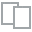
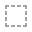
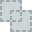
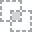
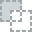
...
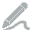
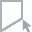
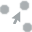
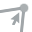
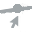

In [165]:
from dataprep.eda import create_report
create_report(df)